In [1]:
# import libraries 
import tensorflow as tf
import keras 
import csv
import matplotlib.pyplot as plt
import numpy as np
from numpy import genfromtxt
from __future__ import division, print_function, absolute_import
#from keras.layers.normalization import BatchNormalization
from tensorflow.keras.layers import BatchNormalization
from keras.layers import Dropout
from keras.models import Sequential
from keras.optimizers import SGD
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import NearestCentroid
import seaborn as sns
from sklearn.metrics import classification_report 
import pylab as pl
import pandas as pd
import shutil
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import silhouette_score
from statistics import stdev
import copy
from keras.models import Model
import tensorflow as tf
from tensorflow import keras
from keras import Input
from tensorflow.keras import layers
from keras.layers import Dense
from keras.models import Model
fig = plt.figure(figsize=(20,10))
import random
import operator

<Figure size 1440x720 with 0 Axes>

In [2]:
#====================
# read csv file and return as list 

def reaCsvFile (f_dir, fileName,selcolomn):
    fileDataAsList=[]
    fileDataAsList=(list(genfromtxt(f_dir+fileName, delimiter=",",skip_header = 1,dtype=None,loose=False,usecols=selcolomn)))
    return fileDataAsList
#===================
# add the physical machine id to the job data with 7 features 
def addMachineIdTo7featuresData(oldData,newData):
    dataset=[]
    for i in oldData:
        for j in newData:
            if i[0]==j[0] :
                print('t')
                i[8]=j[4]
                break
    return dataset
#=====================

def selectColumn (array,columnNum):#select one colum fo table 
    retArray=[]
    for a in array:
        retArray.append(a[columnNum])
    return retArray
#======================
#function that arrange data baed on the range and if the data has non will make it 0
def selectDataFromRangWithConsiderNon(OneRecord,Datarange):
    data=[]
    for r in Datarange:
        if OneRecord[r]==None:
            data.append(0)
        data.append(OneRecord[r])
        
    return data
#==========================
def writeFinalResultDataToFile (FileDierction,fheader,array6):
    f1=open(FileDierction, 'w')#create or opne file for all jobs alone
    writer3 = csv.writer(f1)#write the data to the file 
    writer3.writerow(fheader)
    for i in range(len(array6)):
        writer3.writerow(array6[i])
#==========================
def getMachineID(dataset,start_time,end_time):
    machineIDs=[]
    for i in dataset:
        if i[6]<end_time and i[7]>start_time:
               machineIDs.append(i[1])
    return machineIDs
#=========================
def getMachineAttribute(machinesID,MachinesData):
        machineAttr=[]
        for i in machinesID:
            for j in MachinesData:
                if i==j[0]:
                    machineAttr.append(j)
                    break
        return machineAttr
#=========================
#add the job to the machine 
def returnJobforMachines(machineIDs,DataSet):
    dataToAdd=[]
    avgCpu=0
    avgMem=0
    for i in DataSet:
        if i[1]==machineIDs:
            #if i[9]<0.363045282 and i[10]>0.361976408:
            avgCpu=(i[2]+i[4])/2
            avgMem=(i[3]+i[5])/2
            
            dataToAdd.append([i[0],avgCpu,avgMem,i[6],i[7],i[8],i[9]])
    return dataToAdd
#=========================
def calculateMaxOfUtalization(schedual):
    cpuMax=0
    memoryMax=0
    statrTime=0
    endTime=0
    duration=0
    if len(schedual.job)>0:
        if len(schedual.job)==1:
            cpuMax=schedual.getjobCPUUsage()
            memoryMax=schedual.getjobMemUsage()
            statrTime=schedual.getjobStartTime()
            endTime=schedual.getjobEndTime()
            duration=schedual.getjobDuration()
        elif len(schedual.job)>1:
            cpuMax=sum(schedual.getjobCPUUsage())
            memoryMax=sum(schedual.getjobMemUsage())
            statrTime=max(schedual.getjobStartTime())
            endTime=max(schedual.getjobEndTime())
            duration=max(schedual.getjobDuration())
    else:
        cpuMax=0
        memoryMax=0
        statrTime=0
        endTime=0
        duration=0
    return cpuMax,memoryMax,statrTime,endTime,duration
#=====================
def calculateMaxOfUtalizationEach5Mints(schedual):
    startTimeclo=0.5095887345679012
    cpuMax=0
    memoryMax=0
    statrTime=0
    endTime=0
    duration=0
    retList=[]
    retList1=[]
    for i in range(100):
        #print(i,'->',len(schedual.job))
        x=i*0.000114155+startTimeclo
        for j in schedual.job:
            #print(j.jobStartTime,'<',x+0.000114155,' and', j.jobEndTime,'>',x)
            if (j.jobStartTime<x and j.jobEndTime>0.5109583333333333):
                #print('here')
                retList.append([j.jobCPUUsage/9,j.jobMemUsage/9,j.jobStartTime/9,
                                j.jobEndTime/9,j.jobDuration/9])
                #print(retList)
            elif (j.jobStartTime<x+0.000114155 and j.jobEndTime>x and (j.jobStartTime>x)):
                retList.append((j.jobCPUUsage,j.jobMemUsage,j.jobStartTime,
                                j.jobEndTime,j.jobDuration))
                
            #else:
               # print('f')
        retList1.append(retList)
        retList=[]
    return retList1

        
#=====================
#for k,m in zip(schedual.getjobStartTime(),schedual.getjobEndTime()):
#                print('k',k,'x1',x,'m',m,'x2',x+0.000114155)
#                if (m>x and k<x+0.000114155):
#                        if len(schedual.job)>0:
#                            if len(schedual.job)==1:
#                                cpuMax=schedual.getjobCPUUsage()
#                                memoryMax=schedual.getjobMemUsage()
#                                statrTime=schedual.getjobStartTime()
#                                endTime=schedual.getjobEndTime()
#                                duration=schedual.getjobDuration()
#                            elif len(schedual.job)>1:
#                                cpuMax=sum(schedual.getjobCPUUsage())
#                                memoryMax=sum(schedual.getjobMemUsage())
#                                statrTime=max(schedual.getjobStartTime())
#                                endTime=max(schedual.getjobEndTime())
#                                duration=max(schedual.getjobDuration())
#                        else:
#                            cpuMax=0
#                            memoryMax=0
#                            statrTime=0
#                            endTime=0
#                            duration=0
#return cpuMax,memoryMax,statrTime,endTime,duration
#====================
def calculateThePercentageOfUsage(pHCapacity,jobRequ,i):
    pec=0
    #print('clcuate pe cent ',pHCapacity)
    pec=np.asarray(jobRequ)/np.asarray(pHCapacity)
    return pec
#====================
def plot_distribution(inp):
    plt.figure()
    ax = sns.distplot(inp)
    plt.axvline(np.mean(inp), color="k", linestyle="dashed", linewidth=5)
    plt.axvline(stdev(inp),color='r', linestyle='-')
    plt.text(stdev(inp),.9,"SD: {:.4f}".format(stdev(inp)),color="r")
    _, max_ = plt.ylim()
    plt.text(
        np.mean(inp) + np.mean(inp) / 10,
        max_ - max_ / 10,
        "Mean: {:.4f}".format(np.mean(inp)),
    )
    
    return plt.figure

def plottingSD (x1,y1,c,t):
            fig, ax = plt.subplots()
            plt.scatter(x1,y1,color=c)
            plt.title(t)
            plt.xlabel("utiliazation")
            plt.ylabel("time")
            #ax = sns.distplot(selectColumn(SortCluster0,2))
            plt.axvline(np.mean(x1), color="k", linestyle="dashed", linewidth=5,label ='mean')
            plt.text(np.mean(x1),.5,"Mean: {:.4f}".format(np.mean(x1)),color="r")
            #plt.scatter(selectColumn(SortCluster0,9),selectColumn(SortCluster0,4))
            plt.axvline(stdev(x1),color='r', linestyle='-')
            plt.text(stdev(x1),.9,"SD: {:.4f}".format(stdev(x1)),color="r")
            sns.displot(x=x1,y=y1)
            plt.title(t)
            plt.xlabel("utiliazation")
            plt.ylabel("time")
            return plt.figure
#========================
#allocate instance onto node

def allocateInstanceOntoNodes(schedul,dataset):# node could be the schedual like alibabaschedul 
    instList=[]
    count=0
    for i in schedul:
        nodeID=i.node.getID()
        count=count+1
        print(count)
        for j in dataset.index:
            #if j==124588790 or j==0:
                #print(j, "point")
            if dataset["nodeid"][j]==nodeID and dataset["msinstanceid"][j] not in instList:
                #print("here",nodeID)
                i.addInstances(dataset["msinstanceid"][j],dataset["instance_cpu_utilization"][j],dataset["instance_memory_utilization"][j],dataset["msname"][j])
                instList.append(dataset["msinstanceid"][j] )
                if len(instList)>6:
                    break
        instList.clear()
#=============================
#write the scheduling in file 
def wirteSchedulInFileToBackup(FileDierction,fheader,schedul): #one node at te time
    nameOftheFile=schedul.node.getID()
    f1=open(FileDierction+"\\"+nameOftheFile+".csv", 'w',newline='')#create or opne file for all jobs alone
    writer3 = csv.writer(f1)#write the data to the file 
    writer3.writerow(fheader)
    for i in range(len(schedul.instances)):
            #print(schedul.instances[i].getID())
            writer3.writerow([schedul.instances[i].getID(),schedul.instances[i].getCPU(),schedul.instances[i].getMem(),schedul.instances[i].getMSserviceName()])
#================================
def wirteSchedulInFileToBackupwithNodeIdInOneFile(FileDierction,fheader,indexOftheRwa,schedul): #one node at te time
    nameOftheFile=schedul.node.getID()
    f1=open(FileDierction, 'a',newline='')#create or opne file for all jobs alone
    writer3 = csv.writer(f1)#write the data to the file 
    if indexOftheRwa==0:
        writer3.writerow(fheader)
    for i in range(len(schedul.instances)):
            #print(schedul.instances[i].getID())
            writer3.writerow([schedul.node.getID(),schedul.instances[i].getID(),schedul.instances[i].getCPU(),schedul.instances[i].getMem(),schedul.instances[i].getMSserviceName()])
    f1.close()
#================================
#restoring the scheduling data from file
def restorSchedulFromFileConfigration(FileDierction,nodeifo):
    restorschedul=[]
    print("1")
    nmachineID=0
    for i,x in zip(nodeifo.index, range(0,len(nodeifo))):
        nmachineID+=10
        print("2 machine id ",nmachineID)
        
        restorschedul.append(schedul(nodeifo["nodeid"][i],nmachineID,nodeifo["max_cpu_utilization"][i],nodeifo["max_memory_utilization"][i]))
        instanceInfo=pd.read_csv(FileDierction+"\\"+nodeifo["nodeid"][i]+'.csv')
        for j in instanceInfo.index:
            restorschedul[x].addInstances(instanceInfo["msinstanceid"][j],instanceInfo["instance_cpu_utilization"][j],instanceInfo["instance_memory_utilization"][j],instanceInfo["msname"][j])
        print("Done")
        instanceInfo=pd.DataFrame()
    return restorschedul
#=================================
#write the result of scheduling into files
# # dirForSaveSchedualData=Dir+"\\allDataFro100NodeInoneHourNoDoublicatioFromSchedul.csv"
# instHeader=["nodeid","msinstanceid","instance_cpu_utilization","instance_memory_utilization","msname"]
# for i in AlibabCluster:
#     wirteSchedulInFileToBackup(dirForSaveSchedualData,instHeader,i)

#================================
def wirteSchedulInFileToBackupwithInstanceDMsInOneFile(FileDierction,fheader,schedul_instance): #one instance at te time
    nameOftheFile=schedul_instance.getID()
    f1=open(FileDierction+"\\"+nameOftheFile+".csv", 'w',newline='')
    writer3 = csv.writer(f1)#write the data to the file 
    writer3.writerow(fheader)
    for i in range(len(schedul_instance.DMGraphs)):
            #print(schedul.instances[i].getID())
            writer3.writerow([schedul_instance.DMGraphs[i].getDM_ID(),schedul_instance.DMGraphs[i].getDM_NodeID()])
    f1.close()
#================================
#count the number of dependencis between nodes by count how many MS in the same node or in different node and counting the satate MD
#it prints the results as SCV file
def count_the_Nmber_of_DM_where_Its_inThesameNode_or_InDifferentNode(schedul):
    node=0
    StateDMcount=0
    countSameNode=0
    countDiffNode=0

    eachNOdcountSameNode=0
    eachNOdcountDiffNode=0
    eachNOdcountStateDM=0
    print("Node No,#total, MD in the same node, MD in the different node, Staste MD")

    for i in schedul:
        node=node+1
        eachNOdcountSameNode=0
        eachNOdcountDiffNode=0
        eachNOdcountStateDM=0
        for j in i.instances:
            for k in j.DMGraphs:
                if k.getDM_NodeID()!=-1 and k.getDM_NodeID==i.node.getID():
                    countSameNode=countSameNode+1
                    eachNOdcountSameNode=eachNOdcountSameNode+1
                elif k.getDM_NodeID()!=-1 and k.getDM_NodeID!=i.node.getID():
                    countDiffNode=countDiffNode+1
                    eachNOdcountDiffNode=eachNOdcountDiffNode+1
                elif k.getDM_NodeID()==-1:
                    StateDMcount=StateDMcount+1
                    eachNOdcountStateDM=eachNOdcountStateDM+1
        countEachNode=eachNOdcountSameNode+eachNOdcountDiffNode+eachNOdcountStateDM
        print(node,",",countEachNode,",",eachNOdcountSameNode,",",eachNOdcountDiffNode,",",eachNOdcountStateDM)
    count=StateDMcount+countSameNode+countDiffNode
    print("total=",count,"\n MD in the same node=",countSameNode,"\n MD in the different node=",countDiffNode,"\n Staste MD=",StateDMcount)
#==================================
#find nodeid forthe dm
def find_nodeid_for_DM(dm,table):
    nodeid=""
    for t in table.index:
        if dm==table["dm"][t]:
            #print("f",table["nodeid"][t])
            nodeid=table["nodeid"][t]
            break
    return nodeid
#==================================
#check if dm alrody been assing to the um service 
def checkDM_inTheList(x,list1):
    t=False
    for i in list1:
        if i==x:
            t= True
            break
    return t   
#==================================
#find nodeid forthe dm
def find_If_nodeid_for_DM_Is_One_Of_TheSchedulNode(nodeId,table):
    t=False
    for t in table.index:
        if nodeId==table["nodeid"][t]:
            #print("f",table["nodeid"][t])
            t=True
            break
    return t

#====================================
# # return the utilization of resources by DM one each time
def returnTheUtilizationOfDM(DM,Re_Utilization):
    cpu_uti=0
    mem_uti=0
    for i in Re_Utilization.index:
        if Re_Utilization["dm"][i]==DM:
            cpu_uti=Re_Utilization["max_cpu_utilization"][i]
            mem_uti=Re_Utilization["max_memory_utilization"][i]
            break
    return cpu_uti, mem_uti
#====================================

#restor dm info from files based on instances id 
def restorDmInfoFromFilesBasedOnInstanceId(FileDierction,instance,DM_Re_Utilization):
    Dmtype=-1
    Dm=-1
    DM_machineIDsIndex=0
    for i,x in zip(instance, range(0,len(instance))):
        instanceID=i.getID()
        DmLists=pd.read_csv(FileDierction+"\\"+instanceID+'.csv')
        for j in DmLists.index:
            Dmtype=-1
            if pd.isna(DmLists["nodeid"][j]):
                    Dmtype=0 #statefull service
                    Dm=-1 #nodeIde
                    
            else:
                Dmtype=1#stateless service
                Dm=DmLists["nodeid"][j]
                #DM_machineID=Return_machienId_for_DM_Is_One_Of_TheSchedulNode(DmLists["dm"][j],instanceID_With_TheirMachinesIDs)#need to be finished
            DM_CPU_Uti, DM_Mem_Uti=returnTheUtilizationOfDM(DmLists["dm"][j],DM_Re_Utilization)# return the utilization of resources by DM one each time 
            if DM_CPU_Uti==0:
                DM_CPU_Uti=random.uniform(0.00445833333333402,0.780749999999534)# random number based on the minmum number of utilization of cpu among DMs
            if DM_Mem_Uti==0:
                DM_Mem_Uti=random.uniform(0.00722503662109375,0.981824398040772)
            DM_machineID=DM_machIDsRandom["machineIdForDMs"][DM_machineIDsIndex]   
            i.addServce(DmLists["dm"][j],DM_machineID,Dm,DM_CPU_Uti, DM_Mem_Uti,-1,Dmtype)
            DM_machineIDsIndex=DM_machineIDsIndex+1
        DmLists=pd.DataFrame()
        
#=====================================
#find If nodeid for DM Is One Of TheSchedulNode
def find_If_nodeid_for_DM_Is_One_Of_TheSchedulNode(DM_NodeID,nodeId):
    t=False
    for i in nodeId:
        if DM_NodeID== i:
            t=True
            break
    return t
#====================================
def Return_machienId_for_DM_Is_One_Of_TheSchedulNode(DM_NodeID,instncelistWithMachineIDs):
    listOFmachnesIDs=[]
    for i in instncelistWithMachineIDs.index:
        if instncelistWithMachineIDs["theServerInTheinstancesID"][i]==DM_NodeID:
            print("mach")
            listOFmachnesIDs.append(instncelistWithMachineIDs["machineID"][i])
    return random.choice(listOFmachnesIDs)
#===================================
#calculate the utilization of instances 

def calculteInstanceUtilization(node):
    cpu_Utiliation=0
    Mem_Utiliztion=0
    for i in node.instances:
        cpu_Utiliztion=cpu_Utiliation+i.getCPU()
        Mem_Utiliztion=Mem_Utiliztion+i.getMem()
    return cpu_Utiliztion,Mem_Utiliztion
#==================================
# return the pod of the michine that host DM 
def find_machine_pod_forDM(dm_ID,mchineList):
    pod=0
    switch=0
    port=0
    for i in mchineList:
        if i.getMachID()==dm_ID:
            pod=i.getpodNumber()
            switch=i.getswitchNumber()
            port=i.getportNumber()
            break
    return pod,switch,port
#==================================
# count the number of dependncy based on the pods (one node each time)
def calculateDepedenciesConsideringTopology(schedule,mchineList):
    node_machinepod=0
    node_machineswitch=0
    node_machineport=0
    DM_machinepod=0
    DM_machineswitch=0
    DM_machineport=0
    Dependencies_num=0
    for i in schedule:
        node_machinepod,node_machineswitch,node_machineport=find_machine_pod_forDM(i.node.getMachineID(),mchineList)
        for j in i.instances:
            if j.getmigrating_ToMachine_Number()!=-1:
                node_machinepod,node_machineswitch,node_machineport=find_machine_pod_forDM(j.getmigrating_ToMachine_Number(),mchineList)
                #print("find instnce thet is migrated")
            for k,index in zip(j.DMGraphs ,range(0,len(j.DMGraphs))):
                DM_machinepod=0
                DM_machineswitch=0
                DM_machineport=0
                Dependencies_num=0
                Dependencies_num=0
                if k.getDM_MigrationNode()==-1:
                    #print("not migrated")
                    DM_machinepod,DM_machineswitch, DM_machineport=find_machine_pod_forDM(k.getDM_MachineId(),mchineList)#return the pod of the michine that host DM 
                    
                else:
                    #print("migrated")
                    DM_machinepod,DM_machineswitch, DM_machineport=find_machine_pod_forDM(k.getDM_MigrationNode(),mchineList)
                if DM_machinepod!=node_machinepod:
                    Dependencies_num=6
                elif k.getDM_MachineId()==i.node.getMachineID() or k.getDM_MigrationNode()==i.node.getMachineID():
                    Dependencies_num=0
                elif DM_machinepod==node_machinepod and DM_machineswitch!=node_machineswitch:
                    Dependencies_num=4
                elif DM_machinepod==node_machinepod and DM_machineswitch==node_machineswitch and k.getDM_MachineId()!=i.node.getMachineID():
                    Dependencies_num=2
                if k.getDM_MigrationNode()==-1:
                    j.add_DepananciesToDMs(Dependencies_num)
                else: 
                    j.DM_Dependencies[index]=Dependencies_num
#===================================
#common methods for Autoencoder 
def Plotting(his):
        # plotting the result 
        plt.plot(his.history['accuracy'])
        plt.plot(his.history['val_accuracy'])
        plt.title('model accuracy')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.show()
        # summarize history for loss
        plt.plot(his.history['loss'])
        plt.plot(his.history['val_loss'])
        plt.title('model loss')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.show()

In [3]:
Dir=r'C:\Users\22772098\OneDrive - The University of Western Australia\Second Year of PhD\dataset\Alibaba dataset\DB'
Dir2=r'D:\Backup\AliBabaDataset\DB'
Dir3=r'F:\Backup\AliBabaDataset\DB'

In [4]:
#machine class 
class Machine:
    def __init__(self,Mach_ID,pod_Nu,swit_Nu,port_nu):
            self.machineID=Mach_ID
            self.cpu=64
            self.vcpu=128
            self.memory=512
            self.podNumber=pod_Nu
            self.switchNumber=swit_Nu
            self.portNumber=port_nu
    def getMachID(self):
        return self.machineID
    def getpodNumber(self):
        return self.podNumber
    def getswitchNumber(self):
        return self.switchNumber
    def getportNumber(self):
        return self.portNumber
    def setPodNumber(self,podNum):
        self.podNumber=podNum
    def setSwitchNumber(self,switchNum):
        self.switchNumber=switchNum
    def setPortNumber(self,portNum):
        self.portNumber=portNum 

In [5]:
#Node class 
class Node: 
    def __init__(self,node_id,pm,node_cpu,node_mem):
            self.physicalMachineId=pm
            self.nodeID=node_id
            self.nodeCPU=node_cpu
            self.nodeMem=node_mem
    def getMachineID(self):
        return self.physicalMachineId        
    def getID(self):
        return self.nodeID
    def getCPU(self):
        return self.nodeCPU
    def getMem(self):
        return self.nodeMem
    def show(self):
        print('Node ID ' ,self.nodeID,
        '\nNode CPU capacity',self.nodeCPU,
        '\nNode CPU capacity',self.nodeMem)
    
        

In [6]:
#DMGraph class 
class DMGraph:
    def __init__(self,DM_id,machId,DM_nodeid,CPU_Uti,Mem_Util, migrate,typ):
            self.DM_ID=DM_id
            self.DM_MachID=machId
            self.DM_NodeID=DM_nodeid
            self.CPU_Utilization=CPU_Uti
            self.Memory_Utilization=Mem_Util
            self.DM_MigratedToNodeID=migrate
            self.ServicType=typ
    def getDM_ID(self):
        return self.DM_ID
    def getDM_CPUUti(self):
        return self.CPU_Utilization
    def getDM_MemUti(self):
        return self.Memory_Utilization
    def getDM_MachineId(self):
        return self.DM_MachID
    def getDM_NodeID(self):
        return self.DM_NodeID
    def getDM_type(self):
        return self.ServicType
    def getDM_MigrationNode(self):
        return self.DM_MigratedToNodeID
    def show(self):
        print('DM ID=' ,self.DM_ID,
        '\nDM Nodeid',self.DM_NodeID )
        
    def setMigrationStatse(self,macineID):
        self.DM_MigratedToNodeID=macineID

In [7]:
#instance class 
class Instance:
    def __init__(self,inst_id,inst_cpu,inst_mem,ms_name):
            self.instID=inst_id
            self.instCPU=inst_cpu
            self.instMem=inst_mem
            self.msName=ms_name
            self.migrating_ToMachine_Number=-1
            self.DMGraphs=[]
            self.DM_Dependencies=[]
    def addServce(self,DM_id,DM_machID,DM_nodeid,CpuUtil,MemUtil,megrateTo,typ):
        self.DMGraphs.append(DMGraph(DM_id,DM_machID,DM_nodeid,CpuUtil,MemUtil,megrateTo,typ))
    def getID(self):
        return self.instID
    def getCPU(self):
        return self.instCPU
    def getMem(self):
        return self.instMem
    def getMSserviceName(self):
        return self.msName
    def show(self):
        print('Instance ID=' ,self.instID,
        '\nInstance  CPU requirment',self.instCPU,
        '\nInstance  Memory requirment',self.instMem,
        '\nInstance microservice namw',self.msName, )
    def ReturnNumberOfDm(self):
        return len(self.DMGraphs)
    def ReturnNumberOfStateFullDmAndStateless(self):
        satFullCount=0
        satLessCount=0
        for i in self.DMGraphs:
            if i.getDM_type()==1:
                satLessCount=satLessCount+1
            else:
                satFullCount=satFullCount+1
        return satFullCount,satLessCount
    def add_DepananciesToDMs(self,Dependency_number):
        self.DM_Dependencies.append(Dependency_number)
    def setMigrationStatse(self,macineID):
        self.migrating_ToMachine_Number=macineID
        
    def getmigrating_ToMachine_Number(self):
        return self.migrating_ToMachine_Number

In [8]:
#schedul calss
class schedul: 
    def __init__(self,iid,pmid,cpu,mem):
        self.node= Node(iid,pmid,cpu,mem)
        self.instances=[]
    def addInstances(self,ID,cpu,mem,MSname):
        self.instances.append(Instance(ID,cpu,mem,MSname))
    def showInstanceRequ(self):
        for i in self.instances:
                print(i.getID(),
                        i.getCPU(),
                        i.getMem(),
                        i.getMSserviceName())
    def reportToTheManagerOfTheschedule(self):
        CPU_utilization=0
        Memor_utilization=0
        numberOfSatefullDM=0
        numberOfSatelessDM=0
        numberOfIntance=0
        NumberofDmIneachInstance=[]
        for i in self.instances:
                CPU_utilization=CPU_utilization+i.getCPU()
                Memor_utilization=Memor_utilization+i.getMem()
                NumberofDmIneachInstance.append(i.ReturnNumberOfDm())
                numberOfSatefullDM,numberOfSatelessDM=i.ReturnNumberOfStateFullDmAndStateless()
        numberOfInstance=len(self.instances)
        return CPU_utilization,Memor_utilization,numberOfSatefullDM,numberOfSatelessDM,numberOfInstance,NumberofDmIneachInstance

In [9]:
#read file as pandas
nodeId=[]
nodeWithInstanceInfo=[]
MSCallGraphFor600Service=[]
allDMServcesWithNodeid=[]
nodeId= pd.read_csv(Dir3+"\\Node_Resource_Utilization_Info.csv")
nodeWithInstanceInfo= pd.read_csv(Dir+"\\nodesWithInstance100ForHour.csv")
MSCallGraphFor600Service=pd.read_csv(Dir+"\\MSCallGraph_For600Scervices.csv")
#dataGrph=pd.read_csv(Dir+"\\MSCallGraph_0.csv")
allDMServcesWithNodeid=pd.read_csv(Dir3+"\\all_DM_services_with_nodeid3.csv")

In [10]:
#randome machine id for statfulll DM seed 
DM_machIDsRandom=pd.read_csv(Dir3+"\\randomMachineIDsFroDMs.csv")

In [11]:
#read instance_id with their machine_ids 
instanceID_With_TheirMachinesIDs=[]
instanceID_With_TheirMachinesIDs= pd.read_csv(Dir3+"\\theServer_In_The_instances_With_machineIDs.csv")

In [12]:
# resd the resource utilization for all services DMs
resourceUtilizationByDMs=[]
resourceUtilizationByDMs=pd.read_csv(Dir3+"\\DM_UtlizationOF_CPU_Mem.csv")

In [13]:
nodeId.head()

,nodeid,max_cpu_utilization,min_cpu_utilization,avg_cpu_utilization,max_memory_utilization,min_memory_utilization,avg_memory_utilization
0,00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f...,0.774743,0.663769,0.714637,0.780301,0.779704,0.779977
1,02d27a3d3bfa1b60f607ef05c14d2e37ef2fdb271e32e7...,0.858238,0.670642,0.753187,0.804146,0.803556,0.803808
2,0386ebfa827ea7af807a8986ccf3cccf67b05b188728c4...,0.827150,0.682374,0.751946,0.752258,0.751681,0.751963
3,07ab653390ac87a39ac76077f8f6d0d3042cc8a762cd9e...,0.792699,0.643549,0.710782,0.766524,0.763651,0.765105
4,09782791cd580bb11523609afcc893647b8538cbdacd27...,0.796399,0.612700,0.714346,0.759620,0.754158,0.757090


In [14]:
print(allDMServcesWithNodeid["dm"][0])

19bf629d5c9ca676ae5571e1ff501172ef1dbcedc1b77e304200534a2eccdf02


In [15]:
# AlibabCluster=[]
# j=0
# for i in nodeId["nodeid"]:
#     AlibabCluster.append(schedul(i,1,1))

In [16]:
#allocateInstanceOntoNodes(AlibabCluster,nodeWithInstanceInfo)

In [17]:
#creat list of machines (100 for now)
machines=[]
count=0
for pod in range(1,17):
    for switch in range(1,9):
        for port in range(1,9):
            count=count+1
            machines.append(Machine(count,pod,switch,port))

In [18]:
# for m in machines:
#     print(m.getMachID(),m.getpodNumber(),m.getswitchNumber())

In [57]:
#restore the schedul information from files 
dirForSaveSchedualData=Dir+"\\nodeSchedul"
restorAlibabaCluster=[]
restorAlibabaCluster=restorSchedulFromFileConfigration(dirForSaveSchedualData,nodeId)

1
2 machine id  10
Done
2 machine id  20
Done
2 machine id  30
Done
2 machine id  40
Done
2 machine id  50
Done
2 machine id  60
Done
2 machine id  70
Done
2 machine id  80
Done
2 machine id  90
Done
2 machine id  100
Done
2 machine id  110
Done
2 machine id  120
Done
2 machine id  130
Done
2 machine id  140
Done
2 machine id  150
Done
2 machine id  160
Done
2 machine id  170
Done
2 machine id  180
Done
2 machine id  190
Done
2 machine id  200
Done
2 machine id  210
Done
2 machine id  220
Done
2 machine id  230
Done
2 machine id  240
Done
2 machine id  250
Done
2 machine id  260
Done
2 machine id  270
Done
2 machine id  280
Done
2 machine id  290
Done
2 machine id  300
Done
2 machine id  310
Done
2 machine id  320
Done
2 machine id  330
Done
2 machine id  340
Done
2 machine id  350
Done
2 machine id  360
Done
2 machine id  370
Done
2 machine id  380
Done
2 machine id  390
Done
2 machine id  400
Done
2 machine id  410
Done
2 machine id  420
Done
2 machine id  430
Done
2 machine id  440


In [58]:
print(restorAlibabaCluster[50].node.getMachineID())

510


In [59]:
AlibabCluster=[]
AlibabCluster=copy.deepcopy(restorAlibabaCluster)


In [60]:
#restor the dm informaion from files
for i in AlibabCluster:
            restorDmInfoFromFilesBasedOnInstanceId(Dir3+'\\instanceDMsFiles',i.instances,resourceUtilizationByDMs)

In [68]:
for i in AlibabCluster[0].instances:
    print(i.getID(),"---", AlibabCluster[0].node.getID())

d41257b648d0f7ccf2a40f9407ce32564ca127e30be696afeebbf9082c3f487d --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff
e634e689cc29815d89c581662c9bf8f5b4796f2f05cc240e133be0ec9639a707 --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff
62a712d29ff849b37f881a76c3d3260a2b4942ea2407216fe207ccc9171241fc --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff
ab7a89febaf24314a4157a8746447fe30d59c2dc34719e906083adddbd580add --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff
3486b2fa9df80fffc7328dbdc2ac279e710ddf80385a9bc5873f8eb3ad37473d --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff
9a80c6ed690ef6973b8cfa54d26af798176c4ee578167b438061a92fa0963060 --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff
ac3d2664c7cc81d292be8c489f96c512856ef117e03f63f766a7d0f6546d0522 --- 00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f7f35e5c6a32d68b4ff


In [67]:
#for i in AlibabCluster[0].instances:
for j in AlibabCluster[0].instances[1].DMGraphs: 
    print(j.getDM_ID(),"--", j.getDM_NodeID(),"--",j.getDM_type())
print(len(AlibabCluster[0].instances[1].DMGraphs))

18a9f3acd887d2681be07b0f3b54530680cfd5b05e4d415dffe7d8662902e890 -- 57e4a26f1041ba6fb65e9878c53e0cee0fc38cfef6e5ce114742e810084db39c -- 1
5670eb9c4289fc3ce138ff101beb267e9c56a8a8143a7559c8c8de59c145bc15 -- -1 -- 0
e5b95cb4a294ca8b852a217ac602f69c266e6b0799d399a2fe9dbc386cc845b4 -- 4f33dcfe0e53725fa9584faf7e7e93c95cc5e6f666506314aa809576d924bac1 -- 1
a717c9bab522eeb8ddeb994498f5236797dd7b2b013df98f54fc9c23b888cb81 -- -1 -- 0
022a4de0c6edcd91e1d277faffb3da39ae07a7197567fecb026ebe66bc0a8135 -- -1 -- 0
9ef909ebc030a74059317ecc5aff2559f4a9a2f3599d87f6e00799b278be35c4 -- -1 -- 0
36e6c5ae0a20a2ce8fb109498527eeda7cfd6daa0cf5bdd39ace9ff9f133b93f -- -1 -- 0
c3ddd3f9ab2d098cace7b2ca8b536d4a396129351801bf2d1a451af4654631cb -- -1 -- 0
8


In [23]:
# calculate the deenencies ans set the dependencies 
calculateDepedenciesConsideringTopology(AlibabCluster,machines)

In [24]:
# ceate data set 
dataset=[]
for i in AlibabCluster:
    #for j in i.node:
        nodeName= i.node.getID()
        NodeCpuU= i.node.getCPU()
        NodeMemU=i.node.getMem()
        for ins in i.instances:
            insName= ins.getID()
            insCpuU= ins.getCPU()
            insMemU= ins.getMem()
            for DMs,DepIndex in zip (ins.DMGraphs, range(0,len(ins.DMGraphs))):
                DMsName= DMs.getDM_ID()
                DMsDepend= ins.DM_Dependencies[DepIndex]
                DMsCpuU= DMs.CPU_Utilization
                DMsMemU= DMs.Memory_Utilization
                dataset.append((nodeName,NodeCpuU,NodeMemU,insName,insCpuU,insMemU,DMsName,DMsDepend,DMsCpuU,DMsMemU,-1))

In [25]:
datasetDF= pd.DataFrame(dataset, columns =['nodeid', 'nodeCPUU','nodeMemU', 'instanceid','instanceCPUU', 'instanceMemU','DMid', 'DMDepend','DMCPUU','DMMemU','lable'])

In [20]:
selectedColumsOfDataset=[]
selectedColumsOfDataset=datasetDF.iloc[:,[1,2,4,5,7,8,9]]

Normilzed_Dataset = selectedColumsOfDataset.copy()
for column in Normilzed_Dataset.columns:
    Normilzed_Dataset[column] = Normilzed_Dataset[column]  / Normilzed_Dataset[column].abs().max()

Normilzed_Dataset.head()
#print(len(Normilzed_Dataset))

,nodeCPUU,nodeMemU,instanceCPUU,instanceMemU,DMDepend,DMCPUU,DMMemU
0,0.902713,0.889708,0.6109,0.846418,1.0,0.322941,0.083996
1,0.902713,0.889708,0.6109,0.846418,1.0,0.783999,0.172426
2,0.902713,0.889708,0.6109,0.846418,1.0,0.067464,0.471644
3,0.902713,0.889708,0.6109,0.846418,1.0,0.393278,0.599592
4,0.902713,0.889708,0.6109,0.846418,1.0,0.919436,0.435256


In [28]:
trainingData= Normilzed_Dataset[:10000]
TestingData=Normilzed_Dataset[10001:]

In [69]:
#creae an autoencoder model (secuntail model )
input_data = keras.Input(shape=(7,))
#encoder0 = (BatchNormalization())(input_data)
#encoder1= (Dropout(0.05))(encoder0)
encoder2 = layers.Dense(5, activation='relu')(input_data)
encoder3 = layers.Dense(3, activation='relu')(encoder2)

code1 = layers.Dense(2, activation='relu')(encoder2)
decoded1 = layers.Dense(3, activation='relu')(code1)
decoded2 = layers.Dense(5, activation='relu')(code1)
output_data = layers.Dense(7, activation='sigmoid')(decoded2)

# This model maps an input to its reconstruction
model = keras.Model(input_data, output_data)

In [70]:
model.compile(optimizer='Adam', loss='mean_squared_error',metrics=['accuracy'])

In [71]:
history=model.fit(trainingData, trainingData,
                epochs=50,
                batch_size=300,
                shuffle=True,
                validation_data=(TestingData, TestingData))

Epoch 1/50
34/34 [==============================] - 1s 6ms/step - loss: 0.1464 - accuracy: 7.0000e-04 - val_loss: 0.1360 - val_accuracy: 0.0000e+00
Epoch 2/50
34/34 [==============================] - 0s 2ms/step - loss: 0.1251 - accuracy: 0.0091 - val_loss: 0.1187 - val_accuracy: 0.0217
Epoch 3/50
34/34 [==============================] - 0s 2ms/step - loss: 0.1118 - accuracy: 0.0715 - val_loss: 0.1080 - val_accuracy: 0.0254
Epoch 4/50
34/34 [==============================] - 0s 2ms/step - loss: 0.1040 - accuracy: 0.0728 - val_loss: 0.1023 - val_accuracy: 0.0254
Epoch 5/50
34/34 [==============================] - 0s 2ms/step - loss: 0.0992 - accuracy: 0.0728 - val_loss: 0.0975 - val_accuracy: 0.0254
Epoch 6/50
34/34 [==============================] - 0s 2ms/step - loss: 0.0944 - accuracy: 0.0728 - val_loss: 0.0924 - val_accuracy: 0.0254
Epoch 7/50
34/34 [==============================] - 0s 2ms/step - loss: 0.0891 - accuracy: 0.0728 - val_loss: 0.0868 - val_accuracy: 0.0254
Epoch 8/50
3

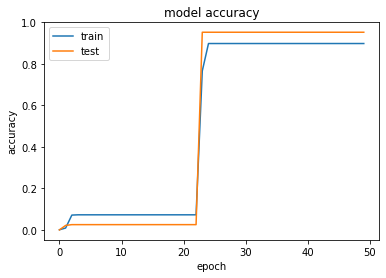

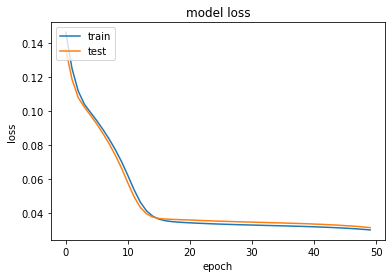

In [72]:
Plotting(history)

In [38]:
model.save('entierModel.h5')

In [39]:
encoder=keras.Model(input_data,code1)

In [40]:
encoder.save('encoderforExtractingMS_Features.h5')

In [24]:
from keras.models import load_model

In [25]:
LoadedMode=load_model('encoderforExtractingMS_Features.h5')

In [73]:
extractedFeatrures=encoder.predict(Normilzed_Dataset)

379/379 [==============================] - 0s 521us/step


In [74]:
print(extractedFeatrures[:10])

[[1.358667  1.4858314]
 [2.0604913 2.1777325]
 [1.7063898 1.718381 ]
 [2.3127677 2.2996569]
 [2.6662154 2.7150853]
 [2.0193653 1.9717621]
 [1.6453124 1.706812 ]
 [2.60076   2.4824748]
 [1.9041759 1.8405894]
 [2.9992573 2.8942535]]


In [78]:
# ceate and traif GM 
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=4, random_state=0).fit(extractedFeatrures)


In [79]:
# predict the lablels 
lables=gm.predict(extractedFeatrures)


In [45]:
# save to file the GM hyperparamenters 
gmm_name = 'gm'
np.save(gmm_name + '_weights', gm.weights_, allow_pickle=False)
np.save(gmm_name + '_means', gm.means_, allow_pickle=False)
np.save(gmm_name + '_covariances', gm.covariances_, allow_pickle=False)



In [46]:
# reload GM's GM hyperparamenters 
means = np.load(gmm_name + '_means.npy')
covar = np.load(gmm_name + '_covariances.npy')
loaded_gmm = mixture.GaussianMixture(n_components = len(means), covariance_type='full')
loaded_gmm.precisions_cholesky_ = np.linalg.cholesky(np.linalg.inv(covar))
loaded_gmm.weights_ = np.load(gmm_name + '_weights.npy')
loaded_gmm.means_ = means
loaded_gmm.covariances_ = covar

NameError: name 'mixture' is not defined

In [80]:
print(lables)

[2 0 2 ... 0 3 2]


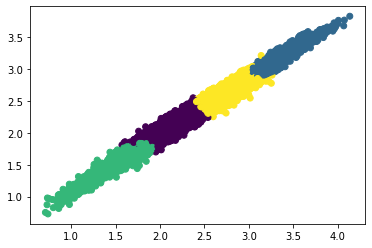

In [883]:
arr=np.array(extractedFeatrures)
plt.scatter(arr[:, 0],arr[:, 1],c=lables)

In [82]:
#batch the label to the data set 
datasetDFLabled = datasetDF.copy()

np.shape(datasetDFLabled)

(12125, 11)

In [83]:
for i,j in zip (datasetDFLabled.index,lables):
    datasetDFLabled["lable"][i]=j

C:\Users\22772098\AppData\Local\Temp\ipykernel_12380\995377284.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datasetDFLabled["lable"][i]=j


In [84]:
datasetDFLabled.head()

,nodeid,nodeCPUU,nodeMemU,instanceid,instanceCPUU,instanceMemU,DMid,DMDepend,DMCPUU,DMMemU,lable
0,00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f...,0.774743,0.780301,d41257b648d0f7ccf2a40f9407ce32564ca127e30be696...,0.287708,0.767368,087a547ca3c4134a50e76d5bf69622be8d2c71d1b15491...,6,0.252136,0.082467,2
1,00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f...,0.774743,0.780301,d41257b648d0f7ccf2a40f9407ce32564ca127e30be696...,0.287708,0.767368,d45b907650050d72216bc2ec5450a5f88a91df39de6954...,6,0.612108,0.169287,0
2,00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f...,0.774743,0.780301,d41257b648d0f7ccf2a40f9407ce32564ca127e30be696...,0.287708,0.767368,ae680ab9ff12c1e6ec3293b26ce7ebca3b332946ae61dc...,6,0.052673,0.463058,2
3,00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f...,0.774743,0.780301,d41257b648d0f7ccf2a40f9407ce32564ca127e30be696...,0.287708,0.767368,cb307cc18f639f8acee9ea39f97590cf8756677dea33a8...,6,0.307052,0.588677,0
4,00cd0e230032d53148cf57180e8444d0c6d94faeaebe5f...,0.774743,0.780301,d41257b648d0f7ccf2a40f9407ce32564ca127e30be696...,0.287708,0.767368,deeea2e9157048f6c5c543ee6f1c40c96c92b18d0ce623...,6,0.717850,0.427332,3


Text(0, 0.5, 'memory Utilization')

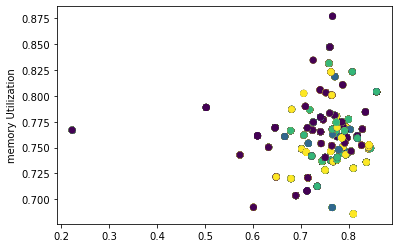

In [85]:
arr=np.array(datasetDFLabled)
plt.scatter(arr[:, 1],arr[:, 2],c=arr[:, 10])

#plt.xlabel("CPU_Utilization")
plt.ylabel("memory Utilization")

Text(0, 0.5, 'memory Utilization')

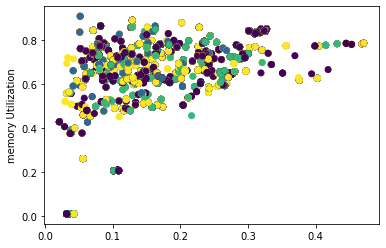

In [86]:
arr=np.array(datasetDFLabled)
plt.scatter(arr[:, 4],arr[:, 5],c=arr[:, 10])
#plt.xlabel("CPU_Utilization")
plt.ylabel("memory Utilization")

Text(0, 0.5, 'memory Utilization')

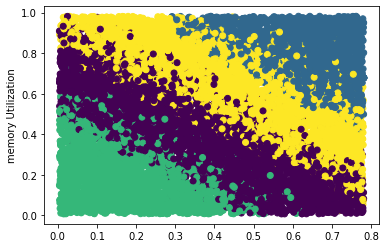

In [87]:
arr=np.array(datasetDFLabled)
plt.scatter(arr[:, 8],arr[:, 9],c=arr[:, 10])
plt.ylabel("memory Utilization")

In [88]:
class0=datasetDFLabled[datasetDFLabled["lable"]==0]
class1=datasetDFLabled[datasetDFLabled["lable"]==1]
class2=datasetDFLabled[datasetDFLabled["lable"]==2]
class3=datasetDFLabled[datasetDFLabled["lable"]==3]
#class4=datasetDFLabled[datasetDFLabled["lable"]==4]

Text(0, 0.5, 'number of dependncy ')

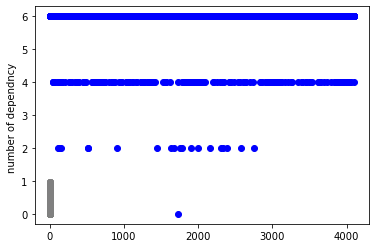

In [89]:
arr0=np.array(class0)
plt.scatter(range(0,len(arr0)),arr0[:, 7],c="blue")

plt.scatter(arr0[:, 1],arr0[:, 2],c="red")
plt.scatter(arr0[:, 4],arr0[:, 5],c="green")
plt.scatter(arr0[:, 8],arr0[:, 9],c="gray")
plt.ylabel("number of dependncy ")

Text(0, 0.5, 'number of dependncy ')

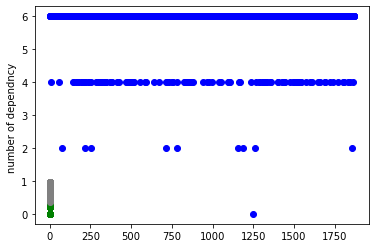

In [90]:
arr1=np.array(class1)
plt.scatter(range(0,len(arr1)),arr1[:, 7],c="blue")
plt.scatter(arr1[:, 1],arr1[:, 2],c="red")
plt.scatter(arr1[:, 4],arr1[:, 5],c="green")
plt.scatter(arr1[:, 8],arr1[:, 9],c="gray")
plt.ylabel("number of dependncy ")

Text(0, 0.5, 'number of dependncy ')

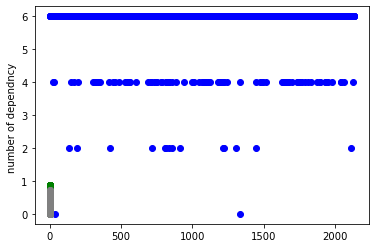

In [91]:
arr2=np.array(class2)
plt.scatter(range(0,len(arr2)),arr2[:, 7],c="blue")
plt.scatter(arr2[:, 1],arr2[:, 2],c="red")
plt.scatter(arr2[:, 4],arr2[:, 5],c="green")
plt.scatter(arr2[:, 8],arr2[:, 9],c="gray")
plt.ylabel("number of dependncy ")

Text(0, 0.5, 'number of dependncy ')

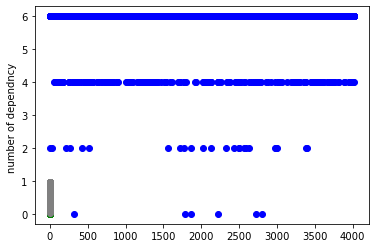

In [92]:
arr3=np.array(class3)
plt.scatter(range(0,len(arr3)),arr3[:, 7],c="blue")
plt.scatter(arr3[:, 1],arr3[:, 2],c="red")
plt.scatter(arr3[:, 4],arr3[:, 5],c="green")
plt.scatter(arr3[:, 8],arr3[:, 9],c="gray")
plt.ylabel("number of dependncy ")

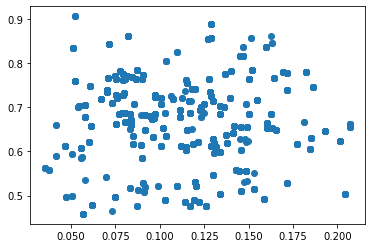

In [485]:
arr4=np.array(class4)
plt.scatter(arr4[:, 4],arr4[:, 5])


# Scheduling Part 

In [157]:
#all methodes for secheduling 
#sorting the DMs in list with execludeing migrated one (for each instance indveduley) one instance each time 

def Return_sorted_DMs_InList_BasedOn_Dependencies_and_ResourceUtilization(inst):#list of DMs for ech instance 
    listOf_potintioalDMs=[]
    for DM,Depend, in zip (inst.DMGraphs,inst.DM_Dependencies):
                if DM.getDM_MigrationNode()==-1:
                    listOf_potintioalDMs.append([DM.getDM_ID(),DM.CPU_Utilization,DM.Memory_Utilization,DM.getDM_MigrationNode()])
    listOf_potintioalDMs.sort(key=operator.itemgetter(1, 2))
    listOf_potintioalDMs.sort(key=lambda x:x[3],reverse=True)
    return listOf_potintioalDMs
#===================================
#return list of cpu utilization and memory utilization for a node 
def return_SUM_of_cpu_Mem_utilization(node):
    CPUUti=[]
    MemUti=[]
    for j in node.instances:
        if node.node.getID()==j.getmigrating_ToMachine_Number() or j.getmigrating_ToMachine_Number()==-1:
            CPUUti.append(j.getCPU())
            MemUti.append(j.getMem())
    return sum(CPUUti), sum(MemUti)
#======================================
def return_SUM_of_cpu_Mem_utilization_for_PMs_beyond_98(machineNumber,schedul):
    CPUUti=0
    MemUti=0
    for s in schedul:
        for inst in s.instances: 
            if (s.node.getMachineID()==machineNumber and inst.getmigrating_ToMachine_Number()==-1) or (inst.getmigrating_ToMachine_Number()!=-1 and inst.getmigrating_ToMachine_Number()==machineNumber):
                    CPUUti+=inst.getCPU()
                    MemUti+=inst.getMem()
                    for dm in inst.DMGraphs:
                        if(dm.getDM_MachineId()==machineNumber and dm.getDM_MigrationNode()==-1) or (dm.getDM_MigrationNode()!=-1 and m.getDM_MigrationNode()==machineNumber):
                                CPUUti+=dm.getDM_CPUUti()
                                MemUti+=dm.getDM_MemUti()
    return CPUUti, MemUti
#===================================
def return_list_of_Potentioal_Machines(ListOfmachines,machine_number): 
    switch_number=0
    pod_number=0
    listOMachinesForReturn=[]
    for i in ListOfmachines:
        if i.getMachID()==machine_number:
            switch_number=i.getswitchNumber()
            pod_number= i.getpodNumber()
            break
            
    for i in ListOfmachines:
        if  i.getpodNumber()==pod_number:# or i.getswitchNumber()==switch_number:# and i.getMachID()!=machine_number:
            listOMachinesForReturn.append(i.getMachID())
    return listOMachinesForReturn         
#===================================
def Returen_Sorted_ListOf_potentioal_Hosts_ForDMs(machines, schedul_node, MachineID_ForTheInsatance,instance):
    TotalnodeCapacity_CPU=0#each machine has just one node therfore the capacity of the mahine is the utilizatoion of all instances in the node
    TotalnodeCapacity_Mem=0
    The_Sum_OfTheCPU_Utilization=0
    The_Sum_OfTheMem_Utilization=0
    listOf_Potential_Hosts=[]
    
    #machineOfTheNode_Number=i.getMachineID()
    
    
    
    #
    #break
#================================
def UpdateDMStatse(instance,DM,MachineID):
    for DMs in instance.DMGraphs:
        if DMs.getDM_ID()==DM:
            DMs.setMigrationStatse(MachineID)
            #print("change the host node")
            break
#=================================
# calaculte the number of dependncy from the nstance list
def sum_TheLIstOf_Dependncies_FromInstance(shedule):
    sumDep=0
    for s in shedule:
        for inst in s.instances:
            for d in inst.DM_Dependencies: 
                sumDep+=d
    return sumDep

#===============================
#return the utilization matrix of machines and nodes
def Utilization_Of_machines_and_Node_Matrix(schedul,machileList):

        list_of_migratedDM=[]
        list_of_utilizationOfnode_byInstances=[]
        listOFUtilizationByNode=[]
        ListOfMachineCapacity=[]
        for s,m in zip (schedul,machileList):
            sumCPUUti=0
            sumMemUti=0
            sumDMCPUUti=0
            sumDMMemUti=0
            listOFUtilizationByNode.append([s.node.getCPU(),s.node.getMem()])
            ListOfMachineCapacity.append([m.vcpu,m.memory])
            for inst in s.instances: 
                #find if the instance was mograted just do not consider it as been from the current nodes
                if inst.getmigrating_ToMachine_Number()==-1: 
                    sumCPUUti+=inst.getCPU()
                    sumMemUti+=inst.getMem()
                    print("inst not migrated")
            for s2 in  schedul:
                    for inst2 in s2.instances:
                        if inst2.getmigrating_ToMachine_Number()==s.node.getMachineID(): 
                            sumCPUUti+=inst2.getCPU()
                            sumMemUti+=inst2.getMem()
                            print("inst migrated")
            for s3 in  schedul:
                        for inst3 in s3.instances:        
                            for DM in inst3.DMGraphs:
                                if DM.getDM_MigrationNode()==s.node.getMachineID() or DM.getDM_MachineId()==s.node.getMachineID():
                                    sumDMCPUUti+=DM.getDM_CPUUti()
                                    sumDMMemUti+=DM.getDM_MemUti()

            list_of_utilizationOfnode_byInstances.append([sumCPUUti,sumMemUti])
            list_of_migratedDM.append([sumDMCPUUti,sumDMMemUti])
        com=[]
        df=pd.DataFrame()
        for i in range(0,len(schedul)):
            print(listOFUtilizationByNode[i],list_of_utilizationOfnode_byInstances[i],list_of_migratedDM[i],ListOfMachineCapacity[i])
            com.append(listOFUtilizationByNode[i]+list_of_utilizationOfnode_byInstances[i]+list_of_migratedDM[i]+ListOfMachineCapacity[i])
        df= pd.DataFrame (com, 
                                    columns=['node utilization CPU','node utilization Mem','instance utilization CPU','instance utilization Mem','migrated DM utilization CPU','migrated DM utilization Mem','machine capacity CPU ','machine capacity Mem'])
        return df
    
#==========================================
# printing the result of scheduling compare to Alibab scheduling 

def display_The_scheduling_result_andStatistics(AlibabaScheduling,optimizedSchedulig,machineList):
    print(sum_TheLIstOf_Dependncies_FromInstance(optimizedSchedulig),sum_TheLIstOf_Dependncies_FromInstance(AlibabaScheduling),"reduction",
         (sum_TheLIstOf_Dependncies_FromInstance(AlibabaScheduling)-sum_TheLIstOf_Dependncies_FromInstance(optimizedSchedulig))/sum_TheLIstOf_Dependncies_FromInstance(AlibabaScheduling))
    
    DataAnalysis=Utilization_Of_machines_and_Node_Matrix(optimizedSchedulig,machineList)
    DataAnalysis.head()
    
    
    cpu_utilization=[]
    Mem_utilization=[]
    cpu_utilization=np.array(DataAnalysis.loc[:,'instance utilization CPU']+DataAnalysis.loc[:,'migrated DM utilization CPU'])/DataAnalysis.loc[:,'machine capacity CPU ']
    Mem_utilization=np.array(DataAnalysis.loc[:,'instance utilization Mem']+DataAnalysis.loc[:,'migrated DM utilization Mem'])/DataAnalysis.loc[:,'machine capacity Mem']
    
    plt.scatter(range(0,len(cpu_utilization)),cpu_utilization,color="blue")
    plt.bar(range(0,len(Mem_utilization)),Mem_utilization,color="green")
    plt.ylabel('machines')
    plt.ylabel("resource utilization ")
    
    
    
    # calculate the mean annd SD 
    pointsCPU=[]
    pointsMem=[]
    pointsCPU=np.array(DataAnalysis.loc[:,'instance utilization CPU']+DataAnalysis.loc[:,'migrated DM utilization CPU'])
    pointsMem=np.array(DataAnalysis.loc[:,'instance utilization Mem']+DataAnalysis.loc[:,'migrated DM utilization Mem'])
    print("Mean=",np.mean(pointsCPU),"SD=", np.std(pointsCPU))
    print("Mean=",np.mean(pointsMem), "SD=",np.std(pointsMem))
    
    
    #pliting the distribution 
    
    
    plot_distribution(pointsCPU)
    plot_distribution(pointsMem)

In [33]:
# #brute force scheduling 
# def Burte_force_For_communication (machineList, schedul):
#     sortedListOfInstanceDM=[]
#     migratedDM_CPU_Uit=[0] * 981
#     migratedDM_Mem_Uit=[0] * 981
#     threshold=0.7
#     for s,index in zip(schedul,range(0,len(schedul))):
#         Free_CPU=0
#         Free_Mem=0
#         for inst in s.instances: 
# #                 Free_CPU=0
# #                 Free_Mem=0
#                 sortedListOfInstanceDM= Return_sorted_DMs_InList_BasedOn_Dependencies_and_ResourceUtilization(inst)
#                 The_Sum_OfTheCPU_Utilization,The_Sum_OfTheMem_Utilization=return_SUM_of_cpu_Mem_utilization(s)#if it could be host it in the same node 
#                 Free_CPU=(128*threshold)-(The_Sum_OfTheCPU_Utilization+migratedDM_CPU_Uit[index])#s.node.getCPU()-The_Sum_OfTheCPU_Utilization
#                 Free_Mem=(512*threshold)-(The_Sum_OfTheMem_Utilization+migratedDM_Mem_Uit[index])#s.node.getMem()-The_Sum_OfTheMem_Utilization

#                 #print(Free_CPU)
#                 #Free_Mem=s.node.getMem()-The_Sum_OfTheMem_Utilization 
#                 for Instance_i_DM in sortedListOfInstanceDM:
#                     if inst.getmigrating_ToMachine_Number()==-1:
#                         if Instance_i_DM[1]<Free_CPU and Instance_i_DM[2]<Free_Mem:
#                             UpdateDMStatse(inst,Instance_i_DM[0],s.node.getMachineID())
#                             migratedDM_CPU_Uit[index]+=Instance_i_DM[1]
#                             migratedDM_Mem_Uit[index]+=Instance_i_DM[2]
#                             Free_CPU=(128*threshold)-(The_Sum_OfTheCPU_Utilization+migratedDM_CPU_Uit[index])#s.node.getCPU()-The_Sum_OfTheCPU_Utilization
#                             Free_Mem=(512*threshold)-(The_Sum_OfTheMem_Utilization+migratedDM_Mem_Uit[index])#s.node.getMem()-The_Sum_OfTheMem_Utilization

#                             #print("needcpu ",Instance_i_DM[1],"freeOfCPU ",Free_CPU ,"needMem ",Instance_i_DM[2],"FreeMem ",Free_Mem)
#                             print("migrated in the same node One ")
                            
#                         else : 
#                             if inst.getmigrating_ToMachine_Number()==-1:
#                                 print(inst.getmigrating_ToMachine_Number())
#                                 ListOfmachineThatShareSwitchOrInTheSamePOD=return_list_of_Potentioal_Machines(machineList,s.node.getMachineID())
#                             else:
#                                 print("consider new host PMs")
#                                 ListOfmachineThatShareSwitchOrInTheSamePOD=return_list_of_Potentioal_Machines(machineList,inst.getmigrating_ToMachine_Number())
# #                             Free_CPU=0
# #                             Free_Mem=0
# #                             The_Sum_OfTheCPU_Utilization=0
# #                             The_Sum_OfTheMem_Utilization=0
#                             for pot_machine in ListOfmachineThatShareSwitchOrInTheSamePOD:
#                                 for s1 in schedul:
#                                     #print(s1.node.getMachineID())
#                                     if s1.node.getMachineID()==pot_machine:
#                                         The_Sum_OfTheCPU_Utilization,The_Sum_OfTheMem_Utilization= return_SUM_of_cpu_Mem_utilization(s1)
#                                         break
#                                 Free_CPU=(128*threshold)-(The_Sum_OfTheCPU_Utilization+migratedDM_CPU_Uit[s1.node.getMachineID()])
#                                 Free_Mem=(512*threshold)-(The_Sum_OfTheMem_Utilization+migratedDM_Mem_Uit[s1.node.getMachineID()])
#                                 if Instance_i_DM[1]<Free_CPU and Instance_i_DM[2]<Free_Mem:
#                                     UpdateDMStatse(inst,Instance_i_DM[0],s1.node.getMachineID())
#                                     migratedDM_CPU_Uit[s1.node.getMachineID()]+=Instance_i_DM[1]
#                                     migratedDM_Mem_Uit[s1.node.getMachineID()]+=Instance_i_DM[2]
#                                     print("migrated in the nigboure node One =======> ")
                                       
# #                         else : 
# #                             ListOfmachineThatShareSwitchOrInTheSamePOD=return_list_of_Potentioal_Machines(machineList,s.node.getMachineID())
# #                             Free_CPU=0
# #                             Free_Mem=0
# #                             The_Sum_OfTheCPU_Utilization=0
# #                             The_Sum_OfTheMem_Utilization=0
# #                             for pot_machine in ListOfmachineThatShareSwitchOrInTheSamePOD:
# #                                 for s2 in schedul:
# #                                     if s2.node.getMachineID==pot_machine:
# #                                         The_Sum_OfTheCPU_Utilization,The_Sum_OfTheMem_Utilization= return_SUM_of_cpu_Mem_utilization(s1)
# #                                         break
# #                                 Free_CPU=s2.node.getCPU()-The_Sum_OfTheCPU_Utilization
# #                                 Free_Mem=s2.node.getMem()-The_Sum_OfTheCPU_Utilization
# #                                 if Instance_i_DM[1]<Free_CPU and Instance_i_DM[2]<Free_Mem:
# #                                     UpdateDMStatse(inst,Instance_i_DM,s2.node.getMachineID())

In [69]:
#brute force scheduling 
def Burte_force_For_communication(machineList, schedul):
    sortedListOfInstanceDM=[]
    migratedDM_CPU_Uit=[0] * 981
    migratedDM_Mem_Uit=[0] * 981
    instance_CPU_Uit=[0] * 98
    instance_Mem_Uit=[0] * 98
    threshold=0.7
    for s,index in zip(schedul,range(0,len(schedul))):
        Free_CPU=0
        Free_Mem=0
        machineIDThatHostMigratedDMS=0
        
        for inst in s.instances: 
#                 Free_CPU=0
#                 Free_Mem=0
            
                sortedListOfInstanceDM= Return_sorted_DMs_InList_BasedOn_Dependencies_and_ResourceUtilization(inst)
                if inst.getmigrating_ToMachine_Number()!=-1: # is the current instancce been migrated if yes 
                    if inst.getmigrating_ToMachine_Number()<98:# is the new hosted PM from the 98 PMs that we have 
                            machineIDThatHostMigratedDMS=inst.getmigrating_ToMachine_Number()# get the hosted PM ID number could be any numer between 0 to 98  
                            The_Sum_OfTheCPU_Utilization,The_Sum_OfTheMem_Utilization=return_SUM_of_cpu_Mem_utilization(schedul[inst.getmigrating_ToMachine_Number()])#if it could be host it in the same node 
                    else: 
                            machineIDThatHostMigratedDMS=inst.getmigrating_ToMachine_Number()# if the hoste PM from 99 to 981 get it number and get the resource utilzation 
                            The_Sum_OfTheCPU_Utilization,The_Sum_OfTheMem_Utilization=return_SUM_of_cpu_Mem_utilization_for_PMs_beyond_98(machineIDThatHostMigratedDMS,schedul)
                else: # if the instance not been migrated 
                    machineIDThatHostMigratedDMS=s.node.getMachineID()
                    The_Sum_OfTheCPU_Utilization,The_Sum_OfTheMem_Utilization=return_SUM_of_cpu_Mem_utilization(s)#if it could be host it in the same node 
                    instance_CPU_Uit[index]+=The_Sum_OfTheCPU_Utilization # add the resource utlization in he index of the PMs in list for examplr if the PM iD is 8 the the resource utilization would be in instance_CPU_Uit[8]
                    instance_Mem_Uit[index]+=The_Sum_OfTheMem_Utilization # the same as above 
                    for s2 in schedul: # have another copy of the schedule to
                        for inst2 in s2.instances: # read the instance one by one 
                            if inst2.getmigrating_ToMachine_Number()==s.node.getMachineID(): # find the current node and calculate the total utilzation of current insatance 
                                instance_CPU_Uit[index]+=inst2.getCPU()# put the 
                                instance_Mem_Uit[index]+=inst2.getMem()
                            for dm2 in inst2.DMGraphs: 
                                if (dm2.getDM_MachineId==s.node.getMachineID()) or (dm2.getDM_MigrationNode()!=-1 and dm2.getDM_MigrationNode()==s.node.getMachineID()):# find all migrated DM the moved to current node to calculate the total resource utilization 
                                        migratedDM_CPU_Uit[index]+= dm2.getDM_CPUUti()
                                        migratedDM_Mem_Uit[index]+=dm2.getDM_MemUti()
                    Free_CPU=(128*threshold)-(instance_CPU_Uit[index]+migratedDM_CPU_Uit[index])#s.node.getCPU()-The_Sum_OfTheCPU_Utilization
                    Free_Mem=(512*threshold)-(instance_CPU_Uit[index]+migratedDM_Mem_Uit[index])#s.node.getMem()-The_Sum_OfTheMem_Utilization
                    # above find out the remain of resource based on thershold ^|
                    #print(Free_CPU)
                    #Free_Mem=s.node.getMem()-The_Sum_OfTheMem_Utilization 
                    for Instance_i_DM in sortedListOfInstanceDM: # dependent DM of current instance 
                        if Instance_i_DM[1]<=Free_CPU and Instance_i_DM[2]<=Free_Mem: # if I can move it to the current node 
                                #print(Instance_i_DM[0],"Free_CPU",Free_CPU ,"Free_Mem", Free_Mem)
                                UpdateDMStatse(inst,Instance_i_DM[0],machineIDThatHostMigratedDMS) # update the state of DM 
                                migratedDM_CPU_Uit[index]+=Instance_i_DM[1]
                                migratedDM_Mem_Uit[index]+=Instance_i_DM[2]
                                Free_CPU=(128*threshold)-(The_Sum_OfTheCPU_Utilization+migratedDM_CPU_Uit[index])#s.node.getCPU()-The_Sum_OfTheCPU_Utilization
                                Free_Mem=(512*threshold)-(The_Sum_OfTheMem_Utilization+migratedDM_Mem_Uit[index])#s.node.getMem()-The_Sum_OfTheMem_Utilization

                                #print("needcpu ",Instance_i_DM[1],"freeOfCPU ",Free_CPU ,"needMem ",Instance_i_DM[2],"FreeMem ",Free_Mem)
                                print("migrated in the same node One ")

                        else: # if the current node ca not take it finde the node that share the same switch of the pod 
                                print("consider new host PMs")

                                ListOfmachineThatShareSwitchOrInTheSamePOD=return_list_of_Potentioal_Machines(machineList,s.node.getMachineID())
                                print("# of eltirnative PMS", len(ListOfmachineThatShareSwitchOrInTheSamePOD))
                                #try to select the one that share same switch
                                #print(len(ListOfmachineThatShareSwitchOrInTheSamePOD),ListOfmachineThatShareSwitchOrInTheSamePOD)
    #                             Free_CPU=0
    #                             Free_Mem=0
    #                             The_Sum_OfTheCPU_Utilization=0
    #                             The_Sum_OfTheMem_Utilization=0
                                Free_CPU2=128
                                Free_Mem2=512
                                The_Sum_OfTheCPU_Utilization2=0
                                The_Sum_OfTheMem_Utilization2=0
                                for pot_machine in ListOfmachineThatShareSwitchOrInTheSamePOD:
                                    for s1 in schedul:
                                        #print(s1.node.getMachineID(),pot_machine)
                                        if s1.node.getMachineID()==pot_machine : # find the node that share the same pod switch  in the schedul 
                                            #print("hhhh")
                                            The_Sum_OfTheCPU_Utilization2,The_Sum_OfTheMem_Utilization2= return_SUM_of_cpu_Mem_utilization(s1)

                                            Free_CPU2=(128*threshold)-(The_Sum_OfTheCPU_Utilization2+migratedDM_CPU_Uit[s1.node.getMachineID()])
                                            Free_Mem2=(512*threshold)-(The_Sum_OfTheMem_Utilization2+migratedDM_Mem_Uit[s1.node.getMachineID()])
                                            machineIDThatHostMigratedDMS=s1.node.getMachineID()
                                            break # if you find the node you need to do calculating once 
                                    #print("condition",Instance_i_DM[1]<=Free_CPU2 ,Instance_i_DM[2]<=Free_Mem2)
                                    #print(Instance_i_DM[0],"Free_CPU2",Free_CPU2 ,"Free_Mem2", Free_Mem2)
                                    if Instance_i_DM[1]<=Free_CPU2 and Instance_i_DM[2]<=Free_Mem2: # if I can move it to node that share same switch of the pod 
                                                    #print(Instance_i_DM[0],"Free_CPU2",Free_CPU2 ,"Free_Mem2", Free_Mem2)
                                                    UpdateDMStatse(inst,Instance_i_DM[0],machineIDThatHostMigratedDMS)
                                                    migratedDM_CPU_Uit[s1.node.getMachineID()]+=Instance_i_DM[1]
                                                    migratedDM_Mem_Uit[s1.node.getMachineID()]+=Instance_i_DM[2]
                                                    print("migrated in the nigboure node One =======> ")

#            

In [138]:
Burte_force_Schedul=[]
Burte_force_Schedul=copy.deepcopy(AlibabCluster)


In [139]:
print(len(Burte_force_Schedul))

98


In [140]:
Burte_force_For_communication(machines, Burte_force_Schedul)

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migr

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure nod

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure n

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure n

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure nod

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure n

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One ==

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigb

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======>

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migr

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure n

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigb

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the same node One 
migrated in the same node One 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltir

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure n

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure n

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the same node One 
m

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider n

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrat

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migr

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node On

consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure n

migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated in the same node One 
migrated

migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
consider new host PMs
# of eltirnative PMS 64
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node One =======> 
migrated in the nigboure node 

In [141]:
calculateDepedenciesConsideringTopology(Burte_force_Schedul,machines)

In [127]:
# dff=Utilization_Of_machines_and_Node_Matrix(Burte_force_Schedul,machines)
# for d in dff.index:
#     if dff['migrated DM utilization CPU'][d]>128 or dff['migrated DM utilization Mem'][d]>512:
#         print(dff['migrated DM utilization CPU'][d],dff['migrated DM utilization Mem'][d])

16092 71066 reduction 0.7735626037767709
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst 

inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
inst not migrated
[0.774742638621059, 0.780300943490308] [1.843458333320451, 4.986516475677491] [26.229803175845376, 32.60362698112198] [128, 512]
[0.858238300933065, 0.804145566305011] [0.8701249999964309, 5.830552101135254] [49.0477112924134, 70.30222711106629] [128, 512]
[0.827149630851631, 0.752258366503217] [0.9730416666606141, 4.4064106941223145] [45.33224966023835, 58.41545759136454] [128, 512]
[0.792699486838726, 0.766523989693287] [0.6177066256978111, 4.767956495285033] [46.16047951903804, 61.68426750840529] [128, 512]
[0.796399252642074, 0.759619828652219] [1.2484248633985775, 5.259108543395996] [43.8870673498389, 70.97231770439558] [128, 512]
[0.714937183701851, 0.720799968466092] [1.039374999993016, 3.5615111509958908] [325.2633942970981, 444.7412161368286] [128, 512]
[0.689716060216062, 0.703656820389022] [0.799968749996818, 4.437273502349854] [58.3

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


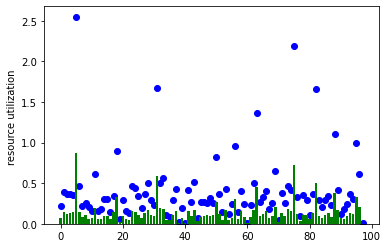

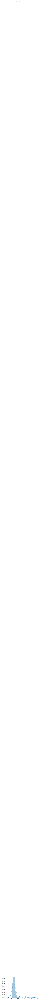

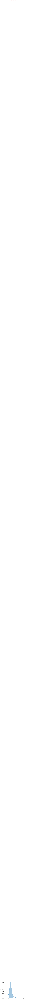

In [142]:
display_The_scheduling_result_andStatistics(AlibabCluster,Burte_force_Schedul,machines)

In [1447]:
# count=0
# for s in Burte_force_Schedul_for_Resource:
#     cpu,mem=return_SUM_of_cpu_Mem_utilization(s)
#     if cpu==0 and mem==0:
#             count+=1
# # print(count)        

In [1448]:
# for s in AlibabCluster:
#     print(s.node.getMachineID()) 

In [143]:
#brute force scheduling 
def Burte_force_For_Reducing_Resources (machineList, schedule):
    count=0
    listOfNOdeUtilization=[]
    for s in schedule:
        sumCPUUti=0
        sumMemUti=0
        #print(s.node.getCPU(),s.node.getMem())
        sumCPUUti,sumMemUti=return_SUM_of_cpu_Mem_utilization(s)#how much the node used from resoource bu sum all instance utilization 
        ListOfmachineThatShareSwitchOrInTheSamePOD=return_list_of_Potentioal_Machines(machineList,s.node.getMachineID())# return all PM that can host the node instances 
        for m in ListOfmachineThatShareSwitchOrInTheSamePOD:#calculate the free capacity of list of PMS 
            for s1 in schedule:
                listOfNOdeUtilization=[]
                if s1.node.getMachineID()==m:
                    print(s1.node.getMachineID(),"===",m,s1.node.getMachineID()==m)
                    CPUUtilizatioForPotinctialPMS=0
                    MemUtilizatioForPotinctialPMS=0
                    CPUUtilizatioForPotinctialPMS,MemUtilizatioForPotinctialPMS=return_SUM_of_cpu_Mem_utilization(s1)
                    CPUUtilizatioForPotinctialPMS=128-CPUUtilizatioForPotinctialPMS
                    MemUtilizatioForPotinctialPMS=512-MemUtilizatioForPotinctialPMS
                    listOfNOdeUtilization.append([s1.node.getMachineID(),CPUUtilizatioForPotinctialPMS,MemUtilizatioForPotinctialPMS])# list of the free capacity of list of PMS 
                    
                    
                    break
            for listOfMachinesWithCapacity in listOfNOdeUtilization:# based on the free capacity we move a instace
                    if sumCPUUti<= listOfMachinesWithCapacity[1] and sumMemUti<=listOfMachinesWithCapacity[2]:
                        for inst in s.instances:
                            print("movied to ", listOfMachinesWithCapacity[0])
                            count+=1
                            inst.setMigrationStatse(listOfMachinesWithCapacity[0])#change the state of the instance after move them 
                        break
    print(count)
    Burte_force_For_communication(machineList,schedule)# call the burte forse algotrithm to reduce the communcation 
    return schedule 

In [158]:
Burte_force_Schedul_for_Resource=[]
Burte_force_Schedul_for_Resource=copy.deepcopy(AlibabCluster)


In [159]:
Burte_force_For_Reducing_Resources(machines,Burte_force_Schedul_for_Resource)

10 === 10 True
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
20 === 20 True
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
30 === 30 True
movied to  30
movied to  30
movied to  30
movied to  30
movied to  30
movied to  30
movied to  30
40 === 40 True
movied to  40
movied to  40
movied to  40
movied to  40
movied to  40
movied to  40
movied to  40
50 === 50 True
movied to  50
movied to  50
movied to  50
movied to  50
movied to  50
movied to  50
movied to  50
60 === 60 True
movied to  60
movied to  60
movied to  60
movied to  60
movied to  60
movied to  60
movied to  60
10 === 10 True
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
movied to  10
20 === 20 True
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
movied to  20
30 === 30 True
movied to  30
movied to  30
movied to  30
movied to  

movied to  280
movied to  280
movied to  280
movied to  280
290 === 290 True
movied to  290
movied to  290
movied to  290
movied to  290
movied to  290
300 === 300 True
movied to  300
movied to  300
movied to  300
movied to  300
movied to  300
310 === 310 True
movied to  310
movied to  310
movied to  310
movied to  310
movied to  310
320 === 320 True
movied to  320
movied to  320
movied to  320
movied to  320
movied to  320
260 === 260 True
movied to  260
movied to  260
movied to  260
movied to  260
movied to  260
movied to  260
270 === 270 True
movied to  270
movied to  270
movied to  270
movied to  270
movied to  270
movied to  270
280 === 280 True
movied to  280
movied to  280
movied to  280
movied to  280
movied to  280
movied to  280
290 === 290 True
movied to  290
movied to  290
movied to  290
movied to  290
movied to  290
movied to  290
300 === 300 True
movied to  300
movied to  300
movied to  300
movied to  300
movied to  300
movied to  300
310 === 310 True
movied to  310
movie

movied to  510
movied to  510
movied to  510
movied to  510
movied to  510
movied to  510
movied to  510
520 === 520 True
movied to  520
movied to  520
movied to  520
movied to  520
movied to  520
movied to  520
530 === 530 True
movied to  530
movied to  530
movied to  530
movied to  530
movied to  530
movied to  530
540 === 540 True
movied to  540
movied to  540
movied to  540
movied to  540
movied to  540
movied to  540
550 === 550 True
movied to  550
movied to  550
movied to  550
movied to  550
movied to  550
movied to  550
560 === 560 True
movied to  560
movied to  560
movied to  560
movied to  560
movied to  560
movied to  560
570 === 570 True
movied to  570
movied to  570
movied to  570
movied to  570
movied to  570
movied to  570
520 === 520 True
movied to  520
movied to  520
movied to  520
movied to  520
movied to  520
530 === 530 True
movied to  530
movied to  530
movied to  530
movied to  530
movied to  530
540 === 540 True
movied to  540
movied to  540
movied to  540
movied 

770 === 770 True
movied to  770
movied to  770
movied to  770
movied to  770
movied to  770
movied to  770
780 === 780 True
movied to  780
movied to  780
movied to  780
movied to  780
movied to  780
movied to  780
790 === 790 True
movied to  790
movied to  790
movied to  790
movied to  790
movied to  790
movied to  790
800 === 800 True
movied to  800
movied to  800
movied to  800
movied to  800
movied to  800
movied to  800
810 === 810 True
movied to  810
movied to  810
movied to  810
movied to  810
movied to  810
movied to  810
820 === 820 True
movied to  820
movied to  820
movied to  820
movied to  820
movied to  820
movied to  820
830 === 830 True
movied to  830
movied to  830
movied to  830
movied to  830
movied to  830
movied to  830
770 === 770 True
movied to  770
movied to  770
movied to  770
movied to  770
movied to  770
780 === 780 True
movied to  780
movied to  780
movied to  780
movied to  780
movied to  780
790 === 790 True
movied to  790
movied to  790
movied to  790
movie

In [160]:
calculateDepedenciesConsideringTopology(Burte_force_Schedul_for_Resource,machines)

142044 71066 reduction -0.9987617144626122
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst migrated
inst 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


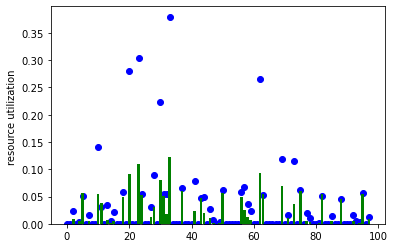

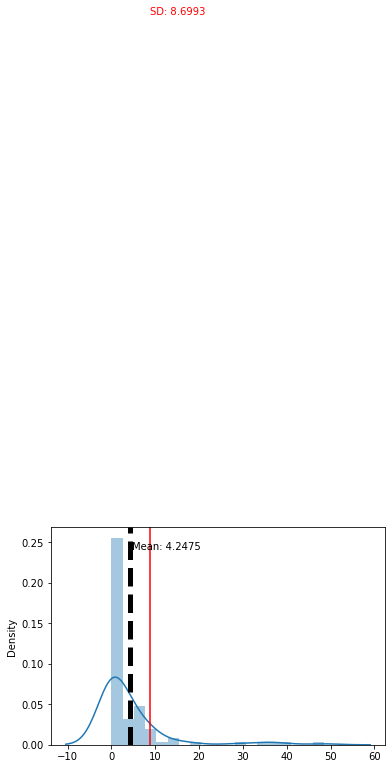

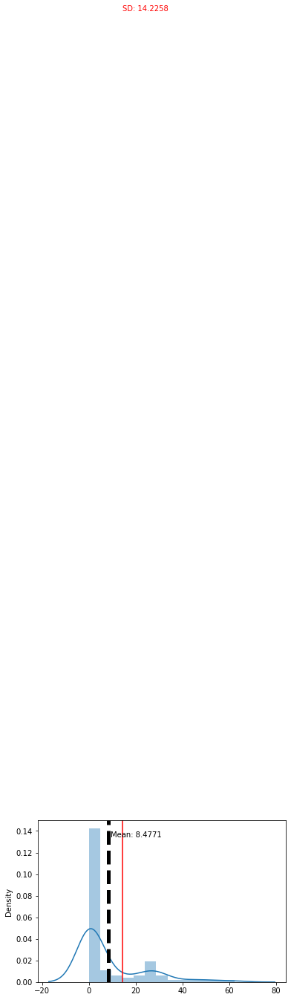

In [161]:
display_The_scheduling_result_andStatistics(AlibabCluster,Burte_force_Schedul_for_Resource,machines)

# Our shedule 

In [880]:
def ourAlgorithm(schedule):
    lables=-1
    for s in schedule:
        sumCPUUti=0
        sumCPUUti=0
        sumCPUUti,sumCPUUti=return_SUM_of_cpu_Mem_utilization(s.node)
        lables=(gm.predict([[sumCPUUti,sumCPUUti]]))
        #list of DMs and run gm to lable them 
        
    return lables

In [881]:
l=ourAlgorithm(AlibabCluster)
for i in l:
    print(i)

[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[2]
[1]
[2]
[1]
[1]
[0]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[3]
[1]
[1]
[1]
[1]
[3]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[1]
[2]
[1]
[1]
[1]
[1]
[1]
[1]
[2]
[1]
[2]


In [329]:
# for s, a in zip(Burte_force_Schedul,AlibabCluster):
#     for insts, insta in zip(s.instances,a.instances):
#         for DMs,DMa in zip(insts.DM_Dependencies,insta.DM_Dependencies):
#             print(DMs,DMa)

In [327]:

# for s, a in zip(Burte_force_Schedul,AlibabCluster):
#     for insts, insta in zip(s.instances,a.instances):
#         for DMs,DMa in zip(insts.DMGraphs,insta.DMGraphs):
#             print(DMs.getDM_MigrationNode(),DMa.getDM_MigrationNode(),s.node.getMachineID(),DMs.getDM_MachineId(),DMs.getDM_MigrationNode())

In [328]:
#testing 

# for i in [AlibabCluster[0]]:
#     for j in [i.instances[0]]:
#         for k ,m in zip(j.DMGraphs,j.DM_Dependencies):
#             print(k.getDM_ID(), k.CPU_Utilization,k.Memory_Utilization,m)
        

In [62]:
#testing 

# sorting_DMs_InList_BasedOn_Dependencies_and_ResourceUtilization(AlibabCluster[0].instances[0])

# some code may be needed 

In [522]:
# count=0
# count1=0
# for i in class2.index:
#     if class2["DMDepend"][i]==6:
#         count+=1
#     if  class2["DMCPUU"][i]==0.0 or class2["DMMemU"][i]==0.0:
#         count1==1
# print(count,count1)

8875 0


In [78]:
# for i in AlibabCluster:
#     print(i.node.getCPU(),i.node.getMem())
#     for j in i.instances:
#         for k in j.DMGraphs:
#             print(k.getDM_type())
    

In [112]:
# count1=count2=0
# dataset=[]
# sumu_CPU=0
# sumu_Mem=0
# for i ,nodeNumber in zip (AlibabCluster, range(1,len(AlibabCluster))):
#     sumu_CPU=0
#     sumu_Mem=0
#     #for insU in i.instances:
#         sumu_CPU+=insU.getCPU()
#         sumu_Mem+=insU.getMem()
#     remainOfCPU=i.node.getCPU()-(sumu_CPU/len(i.instances))
#     remainMemory=i.node.getMem()-(sumu_Mem/len(i.instances))
#     #i.node.getCPU(),i.node.getMem()
#     for k in i.instances:
#         for d in k.DMGraphs:
#             dataset.append([(nodeNumber,remainOfCPU,remainMemory,d.CPU_Utilization,d.Memory_Utilization)])
#             count2=count2+1
# print(count1,"=",count2,dataset)

0 = 12125 [[(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0.197333333333275, 0.549263954162598)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0.281500000000233, 0.812427282333374)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.5113914481467088, 0.06794144696495208, 0, 0)], [(1, 0.

In [113]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=6, random_state=0).fit(dataset)


ValueError: Found array with dim 3. Estimator expected <= 2.

In [141]:
lables=gm.predict(dataset)

In [155]:
print(lables,dataset)

[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 5 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 5 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 5 3
 5 3 3 3 3 3 3 3 3 3 3 3 5 3 5 3 3 3 3 3 3 3 3 5 3 3 3 3 3 3 5 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0 0
 5 0 0 0 0 0 0 0 0 0 0 0 0 5 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 5 0 0 2 2 2 5 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2 4 2 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 4 1 1 1 4 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1 4 4 1
 1 4 1 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1] [[793, 0, 0.6732903167866199, 1, 6], [465, 0, 0.7710903895716963, 1, 6], [319, 0, 0.23237494470373554, 1, 6], [636, 0, 0.5037025539245228, 1, 6], [685, 0, 0.2557564480363175, 2, 6], [927, 1, 0.42824759444461336

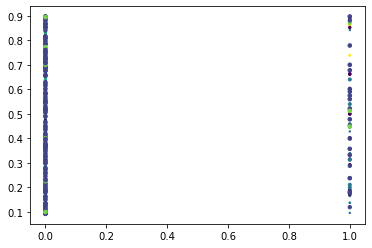

In [157]:
arr=np.array(dataset)
plt.scatter(arr[:, 1],arr[:, 2],arr[:, 3],c=lables)

In [298]:
# def co(dm,listofservcenameinInstance):
#     count=0
#     for i in listofservcenameinInstance.index:
#         if dm==listofservcenameinInstance["theServerInTheinstancesID"][i]:
#             count=count=1
#     return count

In [299]:
#cheking 
# count=0
# for i in AlibabCluster:
#     for j in i.instances:
#         for k in j.DMGraphs:
#             count=count+co(k.getDM_ID(),instanceID_With_TheirMachinesIDs)
# print(count)            
            


0


In [260]:
#MADE a scv table from it called random machineid for DMs 
# for i in AlibabCluster[0].instances:
#     for j in i.DMGraphs:
#         print(j.getDM_MachineId())

In [104]:
#calculate the utilization 

# calculteInstanceUtilization(AlibabCluster[0])

(0.263458333335196, 9.067907333374023)

In [85]:
#printing the report 
for i in AlibabCluster:
    print(i.reportToTheManagerOfTheschedule())

(1.843458333320451, 4.986516475677491, 0, 0, 7, [5, 8, 51, 0, 1, 6, 0])
(0.8701249999964309, 5.830552101135254, 9, 1, 8, [34, 100, 100, 10, 34, 100, 100, 10])
(0.9730416666606141, 4.4064106941223145, 1, 0, 7, [0, 51, 51, 0, 1, 16, 1])
(0.6177066256978111, 4.767956495285033, 0, 0, 7, [0, 0, 0, 1, 61, 61, 0])
(1.2484248633985775, 5.259108543395996, 18, 5, 7, [6, 10, 100, 3, 100, 61, 23])
(1.039374999993016, 3.5615111509958908, 96, 4, 6, [100, 62, 10, 39, 3, 100])
(0.799968749996818, 4.437273502349854, 0, 0, 7, [65, 75, 76, 0, 4, 0, 0])
(1.1066666666689953, 4.614205837249757, 0, 0, 7, [28, 5, 36, 0, 0, 0, 0])
(0.9296875000057594, 4.5503554344177255, 2, 0, 7, [46, 0, 25, 25, 6, 0, 2])
(0.20441666666884, 0.707633256912231, 65, 0, 1, [65])
(0.7117083333325959, 4.463619470596313, 0, 0, 7, [75, 0, 6, 0, 12, 9, 0])
(0.1731249999992236, 1.1824841499328609, 1, 0, 2, [11, 1])
(0.9018333333311612, 4.037799715995789, 43, 4, 7, [0, 37, 0, 8, 7, 0, 47])
(1.0827291666755623, 4.068041324615478, 0, 0, 7,

In [164]:
# count=0
# statelssDM=[]
# statefullDM=[]
# for i in AlibabCluster:
#     for j in i.instances:
#         for k in j.DMGraphs:
#             #k.getDM_type()
#             if k.getDM_type()==1:
#                 statelssDM.append(k.getDM_ID()+","+)
#                 count=count+1
#             else:
#                 statefullDM.append(k.getDM_ID())
# print(count)

1520


In [271]:
#MADE a scv table from it called theServer_In_The_instances_With_machineIDs.csv
# count=0

for i in AlibabCluster:
    for j in i.instances:
        print(j.getMSserviceName(),",",i.node.physicalMachineId)
        count=count+1
print(count)

19bf629d5c9ca676ae5571e1ff501172ef1dbcedc1b77e304200534a2eccdf02 , 1
1c5307cb13f51dc98e4e1b996292f7f05a78966b867c18658e13f8e6ea947283 , 1
39941cd5d9ee45144faf14af503db83864642575fb8b449cdeb06869ab330bbf , 1
558da361022f2c54ce6bb02912687c090acf7454f62fda75744147689918f5ea , 1
61907af770acd8c9bd15f09fa6836818d41fd772482066415ec59eb6ffaea358 , 1
a828cf949747f47b182e8269b324b8948f97330f6104f9d893e40a52dd62b26d , 1
b3b7130eda7fa74cdb22efdbddf25c28f5dca36bc346bb97ea639644ed766376 , 1
19bf629d5c9ca676ae5571e1ff501172ef1dbcedc1b77e304200534a2eccdf02 , 1
1c5307cb13f51dc98e4e1b996292f7f05a78966b867c18658e13f8e6ea947283 , 1
39941cd5d9ee45144faf14af503db83864642575fb8b449cdeb06869ab330bbf , 1
558da361022f2c54ce6bb02912687c090acf7454f62fda75744147689918f5ea , 1
61907af770acd8c9bd15f09fa6836818d41fd772482066415ec59eb6ffaea358 , 1
a828cf949747f47b182e8269b324b8948f97330f6104f9d893e40a52dd62b26d , 1
b3b7130eda7fa74cdb22efdbddf25c28f5dca36bc346bb97ea639644ed766376 , 1
07ddb3a13f245524c8b69163b6c141aafa

In [166]:
res=[]
[res.append(x) for x in statelssDM if x not in res]
print(len(res))

res1=[]
[res1.append(x) for x in statefullDM if x not in res1]
print(len(res1))

156
2490


In [25]:
# #assing the dm to the nodes
# chechlist=[]
# for Schedul_nodes in AlibabCluster:
#     nodeId=Schedul_nodes.node.getID()
#     for Schedul_instance in Schedul_nodes.instances:
#         #print(Schedul_instance.getMSserviceName())
#         count=0
#         chechlist.clear()
#         for Schedul_Grap_index in MSCallGraphFor600Service.index:
#             if count>=100:
#                 break
#             if Schedul_instance.getMSserviceName()==MSCallGraphFor600Service["um"][Schedul_Grap_index]and count <100 and True!=(checkDM_inTheList(MSCallGraphFor600Service["dm"][Schedul_Grap_index],chechlist)):
#                         DMnodeid=find_nodeid_for_DM(MSCallGraphFor600Service["dm"][Schedul_Grap_index],allDMServcesWithNodeid)
#                         Schedul_instance.addServce(MSCallGraphFor600Service["dm"][Schedul_Grap_index],DMnodeid,_,2)
#                         count=count+1
#                         chechlist.append(MSCallGraphFor600Service["dm"][Schedul_Grap_index])
#                         #print("add")

In [46]:
# #count how many node depend on other and print the matrix 
# def count_how_many_node_depend_on_other_and_print_the_matrix(schedule):
#     node=0
#     StateDMcount=0
#     countSameNode=0
#     countDiffNode=0

#     eachNOdcountSameNode=0
#     eachNOdcountDiffNode=0
#     eachNOdcountStateDM=0
#     #print("Node No,#total, MD in the same node, MD in the different node, Staste MD")

#     for i in schedule:
#         node=node+1
#         eachNOdcountSameNode=0
#         eachNOdcountDiffNode=0
#         eachNOdcountStateDM=0
#         for j in i.instances:
#             for k in j.DMGraphs:
#                 if k.getDM_NodeID()!="" and  find_If_nodeid_for_DM_Is_One_Of_TheSchedulNode(k.getDM_NodeID(),nodeId):
#                     countDiffNode=countDiffNode+1
#                     #print("f")
#     print(countDiffNode)
# count_how_many_node_depend_on_other_and_print_the_matrix(AlibabCluster)

0


In [267]:
# reandomDM_machineId=[]
# for i in range(0,12125):
#     reandomDM_machineId.append(random.randint(1,1024))
# for i in reandomDM_machineId:
#     print(i) 

In [268]:
# print(AlibabCluster[2].node.getID())
# for i in AlibabCluster[0].instances:
#     for j in i.DMGraphs:
#         print(j.getDM_NodeID())

In [313]:
#write the instance in files to backup 
# DM_header=["dm","nodeid"]
# DirctForWritingDMForAllInstance=Dir2+'\\instanceDMsFiles'
# for i in AlibabCluster:
#     for j in i.instances:
#         wirteSchedulInFileToBackupwithInstanceDMsInOneFile(DirctForWritingDMForAllInstance,DM_header,j)

In [253]:
#printing the DMs in all instances 
# for i in AlibabCluster[:1]: 
#     for j,f in zip (i.instances,range (0,len(i.instances))):
#         print("instnace")
#         for k in j.DMGraphs:
#             print(f,":",k.getDM_ID())

In [84]:
#conting the number of MD in each node where it is local depencency or depend on service in other  nosde

count_the_Nmber_of_DM_where_Its_inThesameNode_or_InDifferentNode(AlibabCluster)

Node No,#total, MD in the same node, MD in the different node, Staste MD
1 , 71 , 0 , 3 , 68
2 , 488 , 0 , 82 , 406
3 , 120 , 0 , 2 , 118
4 , 123 , 0 , 2 , 121
5 , 303 , 0 , 42 , 261
6 , 314 , 0 , 31 , 283
7 , 220 , 0 , 7 , 213
8 , 69 , 0 , 12 , 57
9 , 104 , 0 , 19 , 85
10 , 65 , 0 , 0 , 65
11 , 102 , 0 , 19 , 83
12 , 12 , 0 , 3 , 9
13 , 99 , 0 , 11 , 88
14 , 61 , 0 , 8 , 53
15 , 123 , 0 , 9 , 114
16 , 90 , 0 , 12 , 78
17 , 46 , 0 , 11 , 35
18 , 178 , 0 , 37 , 141
19 , 174 , 0 , 18 , 156
20 , 20 , 0 , 5 , 15
21 , 46 , 0 , 11 , 35
22 , 55 , 0 , 13 , 42
23 , 43 , 0 , 6 , 37
24 , 44 , 0 , 7 , 37
25 , 94 , 0 , 18 , 76
26 , 262 , 0 , 19 , 243
27 , 65 , 0 , 12 , 53
28 , 122 , 0 , 21 , 101
29 , 262 , 0 , 19 , 243
30 , 94 , 0 , 22 , 72
31 , 94 , 0 , 22 , 72
32 , 183 , 0 , 14 , 169
33 , 164 , 0 , 27 , 137
34 , 55 , 0 , 2 , 53
35 , 52 , 0 , 2 , 50
36 , 33 , 0 , 1 , 32
37 , 119 , 0 , 10 , 109
38 , 91 , 0 , 16 , 75
39 , 5 , 0 , 0 , 5
40 , 68 , 0 , 5 , 63
41 , 34 , 0 , 3 , 31
42 , 129 , 0 , 15 , 11

In [46]:
#write the result of scheduling into files
# dirForSaveSchedualData=Dir+"\\allDataofNodeGettingFromSchedul.csv"
# instHeader=["nodeid","msinstanceid","instance_cpu_utilization","instance_memory_utilization","msname"]
# for i,j in zip(AlibabCluster,range(0,len(AlibabCluster))):
#     wirteSchedulInFileToBackupwithNodeIdInOneFile(dirForSaveSchedualData,instHeader,j,i)

In [19]:
# #need to complete 
# restorAlibabaCluster[0].node.show()
# isT=(AlibabCluster[10].instances[0].getID()==restorAlibabaCluster[10].instances[0].getID() and 
#      AlibabCluster[10].instances[0].getCPU()==restorAlibabaCluster[10].instances[0].getCPU() and
#        AlibabCluster[10].instances[0].getMem()==restorAlibabaCluster[10].instances[0].getMem())
# print(isT)



In [18]:
# print(len(um))
# count=0
# for i in AlibabCluster:
#     print(len(i.instances))
#     count=count +len(i.instances)
    
# print(count)
    

In [67]:
# intheSameNode=0
# notintheSameNode=0
# for a, b in zip (um.index,dm.index):
#     i=MSCallGraphFor600Service["um"][a]
#     j=MSCallGraphFor600Service["um"][b]
#     for v in AlibabCluster[:0]:
#         fount=False
#         for inst in v.instances[:0]: 
#                 print(inst.getMSserviceName())
#                 if inst.getMSserviceName()==i:
#                     for s in v.instances:
#                         #print(s.getID(),j)
#                         if s.getMSserviceName()==j:
#                                 intheSameNode=intheSameNode+1
#                                 #print('in')
#                                 fount=True
#                     if fount==False:
#                             notintheSameNode=notintheSameNode+1
#                             #print('out')

